In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import Levenshtein
import numpy as np
import math
import statistics
from sklearn.metrics import confusion_matrix

In [2]:
def compute_series_record(values):
    count = len(values)
    features = {"count": count}

    if count > 0:
        features["mean"] = statistics.mean(values)
        features["median"] = statistics.median(values)
        features["pstdev"] = statistics.pstdev(values)
        features["max"] = max(values)
        features["min"] = min(values)
    else:
        features["mean"] = None
        features["median"] = None
        features["pstdev"] = None
        features["max"] = None
        features["min"] = None

    return features

In [3]:
def assign_series(root, mount, values):
    root[mount] = compute_series_record(values)

In [4]:
def calculate_digraphs(df):
    character_bigram_raw_il = {}
    character_bigram_raw_pl = {}
    character_bigram_raw_rl = {}
    character_bigram_raw_hl = {}
    character_bigram_counts = {}

    for _, row in df.iterrows():
        digraph = row["Digraphs"]
        il = row["IL"]
        hl = row["HL"]
        pl = row["PL"]
        rl = row["RL"]

        if isinstance(digraph, str) and len(digraph) <= 2:
            index = digraph

            if index in character_bigram_counts:
                raw_il_list = character_bigram_raw_il[index]
                raw_pl_list = character_bigram_raw_pl[index]
                raw_rl_list = character_bigram_raw_rl[index]
                raw_hl_list = character_bigram_raw_hl[index]
                character_bigram_counts[index] += 1
            else:
                raw_il_list = []
                raw_pl_list = []
                raw_rl_list = []
                raw_hl_list = []

                character_bigram_counts[index] = 1
                character_bigram_raw_il[index] = raw_il_list
                character_bigram_raw_pl[index] = raw_pl_list
                character_bigram_raw_rl[index] = raw_rl_list
                character_bigram_raw_hl[index] = raw_hl_list

            raw_il_list.append(il)
            raw_pl_list.append(pl)
            raw_rl_list.append(rl)
            raw_hl_list.append(hl)

    digraphs = {}
    for key in character_bigram_counts:
        assign_series(digraphs, key + "_il", character_bigram_raw_il[key])
        assign_series(digraphs, key + "_pl", character_bigram_raw_pl[key])
        assign_series(digraphs, key + "_rl", character_bigram_raw_rl[key])
        assign_series(digraphs, key + "_hl", character_bigram_raw_hl[key])

    return digraphs

In [5]:
def implode(obj, tgt=None, namespace=""):
    if tgt is None:
        tgt = {}

    for key in obj:
        val = obj[key]

        if namespace == "":
            ref = key
        else:
            ref = namespace + "_" + key

        if type(val) is dict:
            implode(val, tgt, ref)
        else:
            tgt[ref] = val

    return tgt

In [6]:
import os
from tqdm import tqdm
import pandas as pd

def calculate_digraphs_latencies(df):
    df['Digraphs'] = df['LETTER'] + df['LETTER'].shift(-1)

    df['HL'] = df['RELEASE_TIME'] - df['PRESS_TIME'].shift(-1)
    df['IL'] = df['PRESS_TIME'].shift(-1) - df['RELEASE_TIME'].shift(-1)
    df['PL'] = df['PRESS_TIME'] - df['PRESS_TIME'].shift(-1)
    df['RL'] = df['RELEASE_TIME'] - df['RELEASE_TIME'].shift(-1)

    df = df.drop(['LETTER'], axis=1)
    df['Digraphs'] = df['Digraphs'].astype(str)
    df = df[df['Digraphs'].str.strip().str.len() == 2]
    df['HL'] = df['HL'].apply(lambda x: x**2)
    df['IL'] = df['IL'].apply(lambda x: x**2)
    df['RL'] = df['RL'].apply(lambda x: x**2)
    df['PL'] = df['PL'].apply(lambda x: x**2)

    return df

def create_feature_set(directory):
    final_set = {}
    flag = []

    file_list = os.listdir(directory)
    total_files = len(file_list)
    processed_files = 0

    start = 0
    end = 15000

    file_list = file_list[start:end+1]
    total_files = len(file_list)

    with tqdm(total=len(file_list), desc="Processing files") as progress_bar:
        for filename in file_list:
            if not filename.endswith("_keystrokes.txt"):
                continue

            user_id = filename.split("_")[0]
            filepath = os.path.join(directory, filename)

            try:
                df = pd.read_csv(filepath, delimiter="\t", encoding='latin-1')
                df['LETTER'] = df['LETTER'].replace(['SHIFT', 'BKSP', 'DEL', 'CAPS_LOCK'], '')
                df['PRESS_TIME'] = pd.to_numeric(df['PRESS_TIME'], errors='coerce')
                df['RELEASE_TIME'] = pd.to_numeric(df['RELEASE_TIME'], errors='coerce')
                df = df.dropna(subset=['PARTICIPANT_ID'])
                df = df[~df['PARTICIPANT_ID'].isin([float('inf'), float('-inf')])]
                df['PARTICIPANT_ID'] = pd.to_numeric(df['PARTICIPANT_ID'], errors='coerce').fillna(df['PARTICIPANT_ID']).astype(int)

                selected_columns = ['PARTICIPANT_ID', 'TEST_SECTION_ID', 'LETTER', 'PRESS_TIME', 'RELEASE_TIME']
                kdf = df.loc[:, selected_columns].copy()

                test_section_counts = kdf.groupby('PARTICIPANT_ID')['TEST_SECTION_ID'].cumcount() + 1

                kdf['USER_ID'] = kdf['PARTICIPANT_ID'].astype(str) + '_'
                kdf.loc[test_section_counts <= 7, 'USER_ID'] += '1'
                kdf.loc[test_section_counts > 7, 'USER_ID'] += '2'

                user_1_df = kdf.loc[kdf['USER_ID'].str.endswith('_1'), :].copy()
                user_1_df = calculate_digraphs_latencies(user_1_df)
                digraph_features = calculate_digraphs(user_1_df)

                if len(digraph_features) > 0:
                    user_features = implode(digraph_features)
                    value = user_1_df['USER_ID'].unique()[0]
                    #user_features['PARTICIPANT_ID'] = value
                    final_set[value] = user_features
                else:
                    flag.append(user_id)

                user_2_df = kdf.loc[kdf['USER_ID'].str.endswith('_2'), :].copy()
                user_2_df = calculate_digraphs_latencies(user_2_df)
                digraph_features = calculate_digraphs(user_2_df)
                if len(digraph_features) > 0:
                    user_features = implode(digraph_features)
                    value = user_2_df['USER_ID'].unique()[0]
                    #user_features['PARTICIPANT_ID'] = value
                    final_set[value] = user_features
                else:
                    flag.append(user_id)

                progress_bar.update(1)
                processed_files += 1

            except FileNotFoundError:
                continue
            
            except pd.errors.ParserError:
                continue

    return final_set

directory = "/Users/nsjain/Downloads/Keystrokes/files"
feature_sets = create_feature_set(directory)

Processing files:  97%|█████████▋| 14548/15001 [05:20<00:09, 45.34it/s]


In [7]:
feature_sets

{'21833_1': {'Th_il_count': 1,
  'Th_il_mean': 27889.0,
  'Th_il_median': 27889.0,
  'Th_il_pstdev': 0.0,
  'Th_il_max': 27889.0,
  'Th_il_min': 27889.0,
  'Th_pl_count': 1,
  'Th_pl_mean': 112225.0,
  'Th_pl_median': 112225.0,
  'Th_pl_pstdev': 0.0,
  'Th_pl_max': 112225.0,
  'Th_pl_min': 112225.0,
  'Th_rl_count': 1,
  'Th_rl_mean': 138384.0,
  'Th_rl_median': 138384.0,
  'Th_rl_pstdev': 0.0,
  'Th_rl_max': 138384.0,
  'Th_rl_min': 138384.0,
  'Th_hl_count': 1,
  'Th_hl_mean': 42025.0,
  'Th_hl_median': 42025.0,
  'Th_hl_pstdev': 0.0,
  'Th_hl_max': 42025.0,
  'Th_hl_min': 42025.0,
  'he_il_count': 1,
  'he_il_mean': 17956.0,
  'he_il_median': 17956.0,
  'he_il_pstdev': 0.0,
  'he_il_max': 17956.0,
  'he_il_min': 17956.0,
  'he_pl_count': 1,
  'he_pl_mean': 98596.0,
  'he_pl_median': 98596.0,
  'he_pl_pstdev': 0.0,
  'he_pl_max': 98596.0,
  'he_pl_min': 98596.0,
  'he_rl_count': 1,
  'he_rl_mean': 78961.0,
  'he_rl_median': 78961.0,
  'he_rl_pstdev': 0.0,
  'he_rl_max': 78961.0,
  'h

In [8]:
import pandas as pd

def dict_generator(dictionary, batch_size):
    keys = iter(dictionary.keys())
    while True:
        batch_dict = {}
        try:
            for _ in range(batch_size):
                key = next(keys)
                batch_dict[key] = dictionary[key]
            yield batch_dict
        except StopIteration:
            if batch_dict:
                yield batch_dict
            break

batch_size = 1000

df_list = []
gen = dict_generator(feature_sets, batch_size)
total_batches = len(feature_sets) // batch_size + 1

with tqdm(total=total_batches, desc="Processing batches") as progress_bar:
    for batch_dict in gen:
        df = pd.DataFrame.from_dict(batch_dict, orient='index')
        df_list.append(df)
        progress_bar.update(1)

df = pd.concat(df_list)
df

Processing batches:   0%|          | 0/28 [00:00<?, ?it/s]

Processing batches: 100%|██████████| 28/28 [01:10<00:00,  2.53s/it]


,Th_il_count,Th_il_mean,Th_il_median,Th_il_pstdev,Th_il_max,Th_il_min,Th_pl_count,Th_pl_mean,Th_pl_median,Th_pl_pstdev,...,.ö_rl_median,.ö_rl_pstdev,.ö_rl_max,.ö_rl_min,.ö_hl_count,.ö_hl_mean,.ö_hl_median,.ö_hl_pstdev,.ö_hl_max,.ö_hl_min
21833_1,1.0,27889.000000,27889.0,0.000000,27889.0,27889.0,1.0,112225.000000,112225.0,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21833_2,1.0,15129.000000,15129.0,0.000000,15129.0,15129.0,1.0,555025.000000,555025.0,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
233209_2,3.0,3744.666667,3969.0,2135.730372,6241.0,1024.0,3.0,132320.333333,20736.0,167927.057054,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39734_2,2.0,2592.500000,2592.5,1503.500000,4096.0,1089.0,2.0,23552.500000,23552.5,7423.500000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
285679_2,2.0,9176.500000,9176.5,1432.500000,10609.0,7744.0,2.0,43840.000000,43840.0,9984.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160159_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
349891_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
144723_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
163905_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
df.reset_index(inplace=True)
df.rename(columns={'index': 'USER_ID'}, inplace=True)
df['PARTICIPANT_ID'] = df['USER_ID'].copy()
df['PARTICIPANT_ID'] = df['PARTICIPANT_ID'].str.split('_').str[0]
df

/var/folders/34/j8dqnjr14_7d5fwpn4wx4zm80000gq/T/ipykernel_60128/1685876985.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df.reset_index(inplace=True)
/var/folders/34/j8dqnjr14_7d5fwpn4wx4zm80000gq/T/ipykernel_60128/1685876985.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['PARTICIPANT_ID'] = df['USER_ID'].copy()


,USER_ID,Th_il_count,Th_il_mean,Th_il_median,Th_il_pstdev,Th_il_max,Th_il_min,Th_pl_count,Th_pl_mean,Th_pl_median,...,.ö_rl_pstdev,.ö_rl_max,.ö_rl_min,.ö_hl_count,.ö_hl_mean,.ö_hl_median,.ö_hl_pstdev,.ö_hl_max,.ö_hl_min,PARTICIPANT_ID
0,21833_1,1.0,27889.000000,27889.0,0.000000,27889.0,27889.0,1.0,112225.000000,112225.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21833
1,21833_2,1.0,15129.000000,15129.0,0.000000,15129.0,15129.0,1.0,555025.000000,555025.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21833
2,233209_2,3.0,3744.666667,3969.0,2135.730372,6241.0,1024.0,3.0,132320.333333,20736.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,233209
3,39734_2,2.0,2592.500000,2592.5,1503.500000,4096.0,1089.0,2.0,23552.500000,23552.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39734
4,285679_2,2.0,9176.500000,9176.5,1432.500000,10609.0,7744.0,2.0,43840.000000,43840.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,285679
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27352,160159_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,160159
27353,349891_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,349891
27354,144723_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,144723
27355,163905_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,163905


In [10]:
unique_values = df['PARTICIPANT_ID'].unique()

if len(unique_values) == 1:
    df.drop(df.index, inplace=True)

In [11]:
print(unique_values)

['21833' '233209' '39734' ... '507135' '41725' '236995']


In [12]:
special_characters = ['', '[', ']', '(', ')', '{', '}', '<', '>', '/', '.', ',', '+', '-', '=', '*', '@', '#', '$', '%', '&', '!', '?', ';', ':', '|', '~', '^', '`', "'", '"', '\x08', '\x11', '\x08#']

column_names = df.columns
total_columns = len(column_names)
columns_to_drop = []

non_null_counts = []

for column in column_names:
    digraph = column.split('_')[0]

    if any(char in special_characters for char in digraph) or len(digraph) == 1:
        columns_to_drop.append(column)

dropped_columns_count = len(columns_to_drop)
dropped_columns_percentage = (dropped_columns_count / total_columns) * 100

print(f"Columns to drop: {dropped_columns_count}")
print(f"Percentage of columns to drop: {dropped_columns_percentage:.2f}%")

df.drop(columns = columns_to_drop, inplace = True)

Columns to drop: 30864
Percentage of columns to drop: 34.34%


In [13]:
df

,USER_ID,Th_il_count,Th_il_mean,Th_il_median,Th_il_pstdev,Th_il_max,Th_il_min,Th_pl_count,Th_pl_mean,Th_pl_median,...,fO_rl_pstdev,fO_rl_max,fO_rl_min,fO_hl_count,fO_hl_mean,fO_hl_median,fO_hl_pstdev,fO_hl_max,fO_hl_min,PARTICIPANT_ID
0,21833_1,1.0,27889.000000,27889.0,0.000000,27889.0,27889.0,1.0,112225.000000,112225.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21833
1,21833_2,1.0,15129.000000,15129.0,0.000000,15129.0,15129.0,1.0,555025.000000,555025.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21833
2,233209_2,3.0,3744.666667,3969.0,2135.730372,6241.0,1024.0,3.0,132320.333333,20736.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,233209
3,39734_2,2.0,2592.500000,2592.5,1503.500000,4096.0,1089.0,2.0,23552.500000,23552.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39734
4,285679_2,2.0,9176.500000,9176.5,1432.500000,10609.0,7744.0,2.0,43840.000000,43840.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,285679
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27352,160159_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,160159
27353,349891_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,349891
27354,144723_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,144723
27355,163905_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,163905


In [14]:
"""
columns_to_plot_cleaned = [col.replace('$', '') for col in columns_to_drop]


# Plotting the number of non-null values in qualified columns
plt.figure(figsize=(10, 6))
plt.bar(range(len(non_null_counts)), non_null_counts)
plt.xlabel('Columns')
plt.ylabel('Number of Non-null Values')
plt.title('Number of Non-null Values in Qualified Columns')
plt.xticks(range(len(non_null_counts)), columns_to_drop, rotation=90)
plt.tight_layout()
plt.show()
"""

"\ncolumns_to_plot_cleaned = [col.replace('$', '') for col in columns_to_drop]\n\n\n# Plotting the number of non-null values in qualified columns\nplt.figure(figsize=(10, 6))\nplt.bar(range(len(non_null_counts)), non_null_counts)\nplt.xlabel('Columns')\nplt.ylabel('Number of Non-null Values')\nplt.title('Number of Non-null Values in Qualified Columns')\nplt.xticks(range(len(non_null_counts)), columns_to_drop, rotation=90)\nplt.tight_layout()\nplt.show()\n"

/Users/nsjain/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 1 () missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/nsjain/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 24 () missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/nsjain/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 127 () missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/nsjain/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 2 () missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/nsjain/Library/Python/3.11/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 25 () missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/nsjain/Library/Python/3.11/lib/python/site-packages/IPython/core

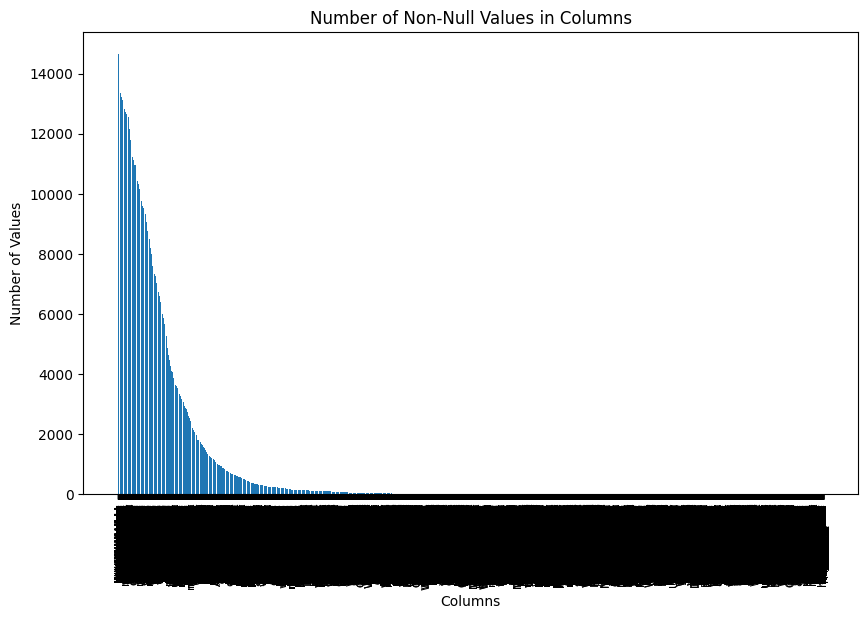

In [15]:
excluded_columns = ['USER_ID', 'PARTICIPANT_ID']
columns_to_plot = [col for col in df.columns if col not in excluded_columns]

value_counts = df[columns_to_plot].count().sort_values(ascending=False)

plt.figure(figsize=(10, 6))  
plt.bar(range(len(value_counts)), value_counts.values)
plt.xlabel('Columns')
plt.ylabel('Number of Values')
plt.title('Number of Non-Null Values in Columns')
plt.xticks(range(len(value_counts)), value_counts.index, rotation=90)

# Adjust the tick labels on the x-axis to display the full column names
plt.tick_params(axis='x', which='major', labelsize=8)

plt.show()

In [16]:
null_values_count = df.isnull().sum()
column_null_values = null_values_count[null_values_count > 0]
column_null_values_count = column_null_values.value_counts().reset_index()
column_null_values_count.columns = ['Number of Null Values', 'Number of Columns']
column_null_values_count_sorted = column_null_values_count.sort_values(by='Number of Null Values', ascending=False)

total_rows = len(df)
column_null_values_count_sorted['Percentage of Null values'] = (column_null_values_count_sorted['Number of Null Values'] / total_rows) * 100

column_null_values_count_sorted.head(25)

,Number of Null Values,Number of Columns,Percentage of Null values
0,27356,12720,99.996345
1,27355,5880,99.992689
2,27354,3168,99.989034
3,27353,2520,99.985379
4,27352,1704,99.981723
5,27351,1296,99.978068
7,27350,960,99.974412
6,27349,1176,99.970757
8,27348,936,99.967102
10,27347,744,99.963446


In [17]:
thresholds = [99, 95, 90, 85, 80, 75, 70, 65, 60, 50, 40, 30, 20, 10, 0]

percentages = []
for threshold in thresholds:
    count = column_null_values_count_sorted[column_null_values_count_sorted['Percentage of Null values'] > threshold]['Number of Columns'].sum()
    percentage = (count / len(df.columns)) * 100
    percentages.append(percentage)

for threshold, percentage in zip(thresholds, percentages):
    print(f"Columns with null values > {threshold}%: {percentage:.2f}%")

Columns with null values > 99%: 79.26%
Columns with null values > 95%: 87.43%
Columns with null values > 90%: 90.16%
Columns with null values > 85%: 92.47%
Columns with null values > 80%: 93.41%
Columns with null values > 75%: 94.47%
Columns with null values > 70%: 95.44%
Columns with null values > 65%: 96.54%
Columns with null values > 60%: 97.56%
Columns with null values > 50%: 99.83%
Columns with null values > 40%: 100.00%
Columns with null values > 30%: 100.00%
Columns with null values > 20%: 100.00%
Columns with null values > 10%: 100.00%
Columns with null values > 0%: 100.00%


In [18]:
null_percentages = (df.isnull().sum() / len(df)) * 100
columns_to_drop = null_percentages[null_percentages > 85].index

print(len(columns_to_drop))
df = df.drop(columns=columns_to_drop)
df

54576


,USER_ID,Th_il_count,Th_il_mean,Th_il_median,Th_il_pstdev,Th_il_max,Th_il_min,Th_pl_count,Th_pl_mean,Th_pl_median,...,gi_rl_pstdev,gi_rl_max,gi_rl_min,gi_hl_count,gi_hl_mean,gi_hl_median,gi_hl_pstdev,gi_hl_max,gi_hl_min,PARTICIPANT_ID
0,21833_1,1.0,27889.000000,27889.0,0.000000,27889.0,27889.0,1.0,112225.000000,112225.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21833
1,21833_2,1.0,15129.000000,15129.0,0.000000,15129.0,15129.0,1.0,555025.000000,555025.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21833
2,233209_2,3.0,3744.666667,3969.0,2135.730372,6241.0,1024.0,3.0,132320.333333,20736.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,233209
3,39734_2,2.0,2592.500000,2592.5,1503.500000,4096.0,1089.0,2.0,23552.500000,23552.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39734
4,285679_2,2.0,9176.500000,9176.5,1432.500000,10609.0,7744.0,2.0,43840.000000,43840.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,285679
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27352,160159_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,160159
27353,349891_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,349891
27354,144723_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,144723
27355,163905_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,163905


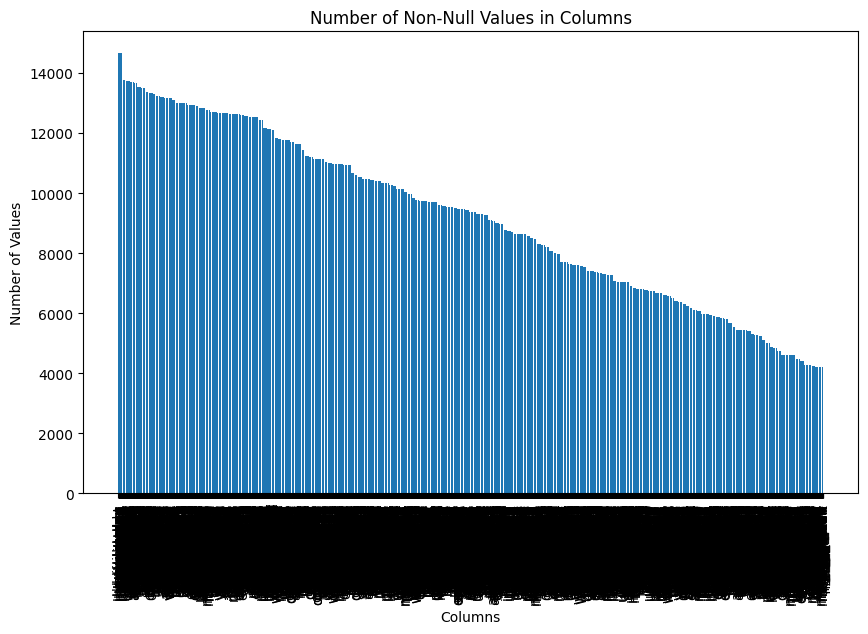

In [19]:
excluded_columns = ['USER_ID', 'PARTICIPANT_ID']
columns_to_plot = [col for col in df.columns if col not in excluded_columns]

value_counts = df[columns_to_plot].count().sort_values(ascending=False)

plt.figure(figsize=(10, 6))
plt.bar(value_counts.index, value_counts.values)
plt.xlabel('Columns')
plt.ylabel('Number of Values')
plt.title('Number of Non-Null Values in Columns')
plt.xticks(rotation=90)  
plt.show()

In [20]:
dataset1 = df
dataset1 = dataset1.drop("PARTICIPANT_ID", axis=1)

In [21]:
dataset1

,USER_ID,Th_il_count,Th_il_mean,Th_il_median,Th_il_pstdev,Th_il_max,Th_il_min,Th_pl_count,Th_pl_mean,Th_pl_median,...,gi_rl_median,gi_rl_pstdev,gi_rl_max,gi_rl_min,gi_hl_count,gi_hl_mean,gi_hl_median,gi_hl_pstdev,gi_hl_max,gi_hl_min
0,21833_1,1.0,27889.000000,27889.0,0.000000,27889.0,27889.0,1.0,112225.000000,112225.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,21833_2,1.0,15129.000000,15129.0,0.000000,15129.0,15129.0,1.0,555025.000000,555025.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,233209_2,3.0,3744.666667,3969.0,2135.730372,6241.0,1024.0,3.0,132320.333333,20736.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,39734_2,2.0,2592.500000,2592.5,1503.500000,4096.0,1089.0,2.0,23552.500000,23552.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,285679_2,2.0,9176.500000,9176.5,1432.500000,10609.0,7744.0,2.0,43840.000000,43840.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27352,160159_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27353,349891_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27354,144723_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27355,163905_1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
from itertools import combinations

unique_participant_ids = df['PARTICIPANT_ID'].unique()

rows = [{'User ID #1': combination[0], 'User ID #2': combination[1], 'Label': 0}
        for participant_id in unique_participant_ids
        for user_ids in [df[df['PARTICIPANT_ID'] == participant_id]['USER_ID'].values]
        for combination in combinations(user_ids, 2)]

new_df1 = pd.DataFrame(rows)
new_df1[['User ID #1', 'User ID #2', 'Label']] = new_df1[['User ID #1', 'User ID #2', 'Label']].astype(int)
new_df1

,User ID #1,User ID #2,Label
0,218331,218332,0
1,2332092,2332091,0
2,397342,397341,0
3,2856792,2856791,0
4,2060521,2060522,0
...,...,...,...
12849,2411622,2411621,0
12850,3779412,3779411,0
12851,4909342,4909341,0
12852,886292,886291,0


In [23]:
import random

num_rows1 = new_df1.shape[0]

unique_users = df['USER_ID'].unique()
combinations_generator = random.sample(list(combinations(unique_users, 2)), num_rows1)

new_df2 = pd.DataFrame(columns=['User ID #1', 'User ID #2', 'Label'])

progress_bar = tqdm(total=len(combinations_generator))

for idx, (user1, user2) in enumerate(combinations_generator, start=1):
    user1_data = df[df['USER_ID'] == user1]['PARTICIPANT_ID'].values
    user2_data = df[df['USER_ID'] == user2]['PARTICIPANT_ID'].values
    if user1_data.size > 0 and user2_data.size > 0 and user1_data[0] != user2_data[0]:
        label = 1
        new_df2.loc[f'Comparison {idx}'] = [user1, user2, label]
    progress_bar.update(1)

progress_bar.close()

new_df2[['User ID #1', 'User ID #2']] = new_df2[['User ID #1', 'User ID #2']].astype(int)
new_df2

100%|██████████| 12854/12854 [14:59<00:00, 14.28it/s]


,User ID #1,User ID #2,Label
Comparison 1,2290431,5060462,1
Comparison 2,3668652,4943392,1
Comparison 3,3856712,955122,1
Comparison 4,76142,4960792,1
Comparison 5,428342,426522,1
...,...,...,...
Comparison 12850,4300211,1914852,1
Comparison 12851,1445642,2921982,1
Comparison 12852,3810242,760781,1
Comparison 12853,1596452,4915092,1


In [24]:
new_df = pd.concat([new_df1, new_df2], ignore_index=True)
new_df

,User ID #1,User ID #2,Label
0,218331,218332,0
1,2332092,2332091,0
2,397342,397341,0
3,2856792,2856791,0
4,2060521,2060522,0
...,...,...,...
25703,4300211,1914852,1
25704,1445642,2921982,1
25705,3810242,760781,1
25706,1596452,4915092,1


In [25]:
new_df['User ID #1'] = new_df['User ID #1'].astype(str).str[:-1] + '_' + new_df['User ID #1'].astype(str).str[-1]
new_df['User ID #2'] = new_df['User ID #2'].astype(str).str[:-1] + '_' + new_df['User ID #2'].astype(str).str[-1]
dataset2 = new_df
dataset2

,User ID #1,User ID #2,Label
0,21833_1,21833_2,0
1,233209_2,233209_1,0
2,39734_2,39734_1,0
3,285679_2,285679_1,0
4,206052_1,206052_2,0
...,...,...,...
25703,430021_1,191485_2,1
25704,144564_2,292198_2,1
25705,381024_2,76078_1,1
25706,159645_2,491509_2,1


In [26]:
class_column = "Label"
if class_column in new_df.columns:
    class_distribution = new_df[class_column].value_counts(normalize=True)
    print("Class Distribution:")
    print(class_distribution)

Class Distribution:
Label
0    0.5
1    0.5
Name: proportion, dtype: float64


In [27]:
dataset1.to_csv("dataset1.csv", index=False)
dataset2.to_csv("dataset2.csv", index=False)

In [28]:
ldf = new_df1.drop(columns=['Label'])

for col in ldf.columns:
    ldf[col] = np.random.permutation(ldf[col].values)

new_df2 = pd.merge(new_df1, ldf, left_index=True, right_index=True)
new_df2.drop(columns=['Label', 'User ID #1_y'], inplace=True)
new_df2.rename(columns={'User ID #1_x': 'User ID #1', 'User ID #2_x': 'User ID #2', 'User ID #2_y': 'User ID #3'}, inplace=True)
new_df2['Label'] = 1

def have_same_last_character(s1, s2):
    return str(s1)[:-1] == str(s2)[:-1]

mask = new_df2.apply(lambda row: have_same_last_character(row['User ID #2'], row['User ID #3']), axis=1)

new_df2.drop(index=new_df2[mask].index, inplace=True)

new_df2

,User ID #1,User ID #2,User ID #3,Label
0,218331,218332,2999621,1
1,2332092,2332091,4001471,1
2,397342,397341,395181,1
3,2856792,2856791,334491,1
4,2060521,2060522,945951,1
...,...,...,...,...
12849,2411622,2411621,1314591,1
12850,3779412,3779411,2595651,1
12851,4909342,4909341,5031581,1
12852,886292,886291,1764011,1


In [29]:
ldf3 = new_df1.drop(columns=['Label'])

for col in ldf.columns:
    ldf3[col] = np.random.permutation(ldf3[col].values)

new_df3 = pd.merge(new_df1, ldf3, left_index=True, right_index=True)
new_df3.drop(columns=['Label', 'User ID #1_y'], inplace=True)
new_df3.rename(columns={'User ID #1_x': 'User ID #1', 'User ID #2_x': 'User ID #2', 'User ID #2_y': 'User ID #3'}, inplace=True)
new_df3['Label'] = 1

def have_same_last_character(s1, s2):
    return str(s1)[:-1] == str(s2)[:-1]

mask = new_df3.apply(lambda row: have_same_last_character(row['User ID #2'], row['User ID #3']), axis=1)

new_df3.drop(index=new_df3[mask].index, inplace=True)

new_df3

,User ID #1,User ID #2,User ID #3,Label
0,218331,218332,4558041,1
1,2332092,2332091,2161091,1
2,397342,397341,4711781,1
3,2856792,2856791,2925021,1
4,2060521,2060522,3880731,1
...,...,...,...,...
12849,2411622,2411621,3462221,1
12850,3779412,3779411,3737421,1
12851,4909342,4909341,91171,1
12852,886292,886291,3988851,1


In [30]:
new_df = pd.concat([new_df2, new_df3], ignore_index=True)
new_df['User ID #1'] = new_df['User ID #1'].astype(str).str[:-1] + '_' + new_df['User ID #1'].astype(str).str[-1]
new_df['User ID #2'] = new_df['User ID #2'].astype(str).str[:-1] + '_' + new_df['User ID #2'].astype(str).str[-1]
new_df['User ID #3'] = new_df['User ID #3'].astype(str).str[:-1] + '_' + new_df['User ID #3'].astype(str).str[-1]
dataset3 = new_df
dataset3

,User ID #1,User ID #2,User ID #3,Label
0,21833_1,21833_2,299962_1,1
1,233209_2,233209_1,400147_1,1
2,39734_2,39734_1,39518_1,1
3,285679_2,285679_1,33449_1,1
4,206052_1,206052_2,94595_1,1
...,...,...,...,...
25702,241162_2,241162_1,346222_1,1
25703,377941_2,377941_1,373742_1,1
25704,490934_2,490934_1,9117_1,1
25705,88629_2,88629_1,398885_1,1


In [31]:
dataset3.to_csv("dataset3.csv", index=False)

EDA

In [32]:
filtered_columns = [col for col in dataset1.columns if col.endswith("il_count")]
filtered_columns.append("USER_ID")
df_filtered = dataset1[filtered_columns]

value_counts = df_filtered.notnull().sum()

sorted_columns = value_counts.sort_values(ascending=False)

columns_sorted_by_values = sorted_columns.index.tolist()
    
corr_matrix = df_filtered.corr()

In [33]:
high_corr_pairs = corr_matrix.unstack().sort_values(ascending=False).drop_duplicates()
top_high_corr_pairs = high_corr_pairs.head(25)
top_high_corr_pairs = top_high_corr_pairs.reset_index()
top_high_corr_pairs.columns = ['Column 1', 'Column 2', 'Correlation']
print("Top 10 highly correlated column pairs:")
print(top_high_corr_pairs)

Top 10 highly correlated column pairs:
       Column 1     Column 2  Correlation
0   Th_il_count  Th_il_count     1.000000
1   ht_il_count  gh_il_count     0.637114
2   he_il_count  th_il_count     0.608175
3   in_il_count  ng_il_count     0.604380
4   ay_il_count  da_il_count     0.570903
5   ou_il_count  yo_il_count     0.564739
6   ld_il_count  ul_il_count     0.554081
7   or_il_count  fo_il_count     0.541503
8   ve_il_count  av_il_count     0.476024
9   il_il_count  ll_il_count     0.441891
10  ti_il_count  io_il_count     0.435535
11  ug_il_count  gh_il_count     0.431620
12  kn_il_count  no_il_count     0.405822
13  io_il_count  on_il_count     0.403291
14  av_il_count  ha_il_count     0.400996
15  kn_il_count  ow_il_count     0.396654
16  il_il_count  wi_il_count     0.392414
17  Th_il_count  he_il_count     0.390923
18  ig_il_count  gh_il_count     0.381333
19  is_il_count  hi_il_count     0.357132
20  we_il_count  ek_il_count     0.353818
21  ig_il_count  ht_il_count     0.35

In [34]:
low_corr_pairs = corr_matrix.unstack().sort_values()
top_low_corr_pairs = low_corr_pairs.head(25)
top_low_corr_pairs = top_low_corr_pairs.reset_index()
top_low_corr_pairs.columns = ['Column 1', 'Column 2', 'Correlation']
print("\nTop 10 low correlated column pairs:")
print(top_low_corr_pairs)


Top 10 low correlated column pairs:
       Column 1     Column 2  Correlation
0   yo_il_count  he_il_count    -0.140219
1   he_il_count  yo_il_count    -0.140219
2   is_il_count  yo_il_count    -0.122042
3   yo_il_count  is_il_count    -0.122042
4   ed_il_count  ou_il_count    -0.091916
5   ou_il_count  ed_il_count    -0.091916
6   he_il_count  hi_il_count    -0.091526
7   hi_il_count  he_il_count    -0.091526
8   yo_il_count  en_il_count    -0.091410
9   en_il_count  yo_il_count    -0.091410
10  th_il_count  yo_il_count    -0.089355
11  yo_il_count  th_il_count    -0.089355
12  st_il_count  yo_il_count    -0.088417
13  yo_il_count  st_il_count    -0.088417
14  as_il_count  ou_il_count    -0.087204
15  ou_il_count  as_il_count    -0.087204
16  ou_il_count  is_il_count    -0.086715
17  is_il_count  ou_il_count    -0.086715
18  yo_il_count  si_il_count    -0.085831
19  si_il_count  yo_il_count    -0.085831
20  yo_il_count  ar_il_count    -0.083811
21  ar_il_count  yo_il_count    -0.0838

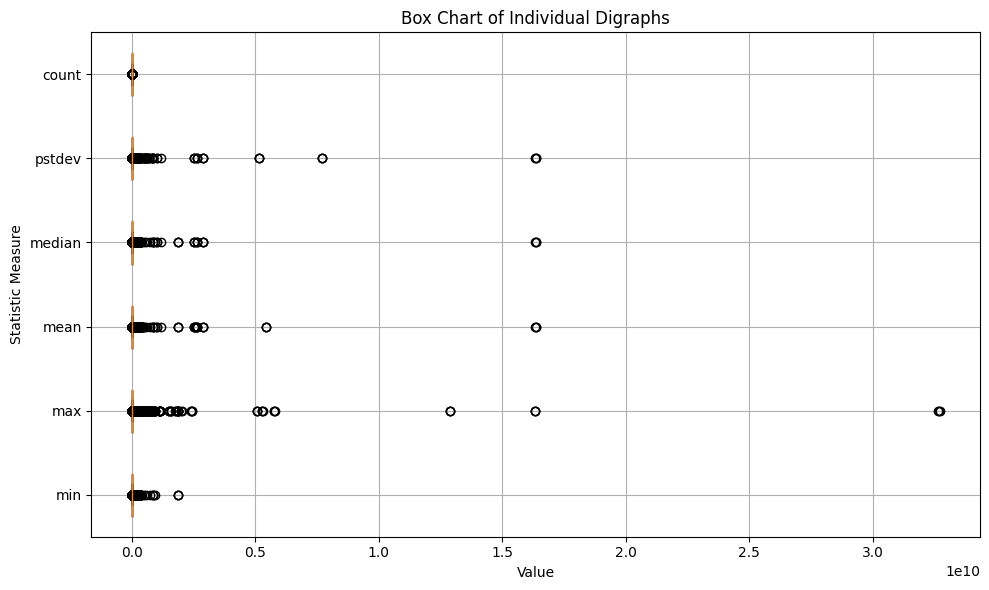

In [48]:
import pandas as pd
import matplotlib.pyplot as plt

df1 = dataset1.drop(columns = ['USER_ID'])

statistics = {
    "min": [],
    "max": [],
    "mean": [],
    "median": [],
    "pstdev": [],
    "count": []
}

for index, row in dataset1.iterrows():
    user_id = row["USER_ID"]
    for col in df1.columns:
        digraph = col.split("_")[0]
        measure = col.split("_")[2]
        #print(measure)
        value = row[col]

        if pd.notnull(value):
            statistics[measure].append(value)

# Plot the box chart
plt.figure(figsize=(10, 6))
box_data = [statistics[measure] for measure in statistics]
box = plt.boxplot(box_data, vert=False)
plt.yticks(range(1, len(statistics) + 1), statistics.keys())
plt.xlabel("Value")
plt.ylabel("Statistic Measure")
plt.title("Box Chart of Individual Digraphs")
plt.grid(True)
plt.tight_layout()
plt.show()


In [61]:
for measure in statistics:
    values = statistics[measure]
    for i in range(len(values)):
        if values[i] > 0.5 * 1e10:
            values[i] = 0.5 * 1e10

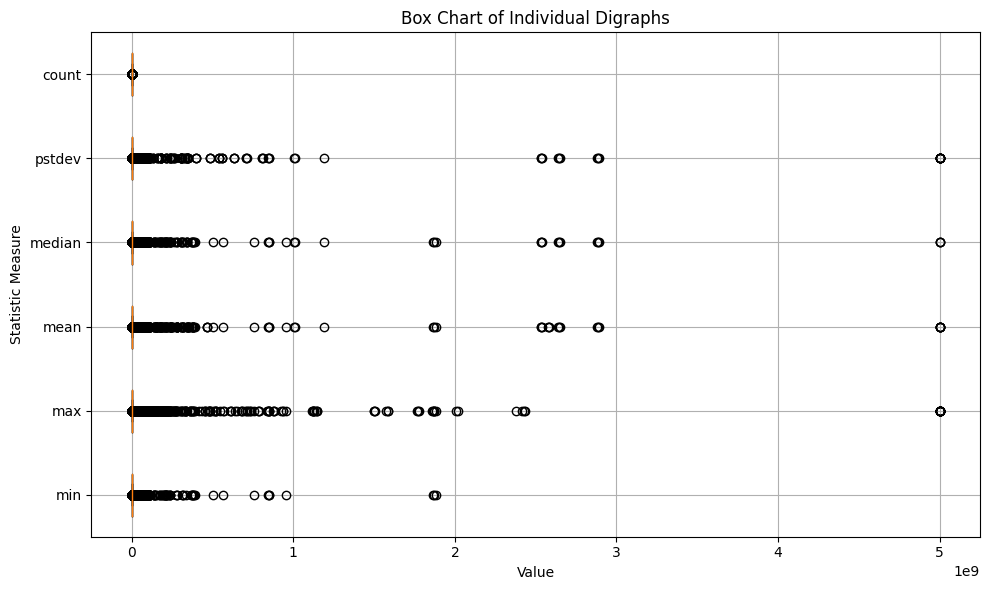

In [62]:
plt.figure(figsize=(10, 6))
box_data = [statistics[measure] for measure in statistics]
box = plt.boxplot(box_data, vert=False)
plt.yticks(range(1, len(statistics) + 1), statistics.keys())
plt.xlabel("Value")
plt.ylabel("Statistic Measure")
plt.title("Box Chart of Individual Digraphs")
plt.grid(True)
plt.tight_layout()
plt.show()

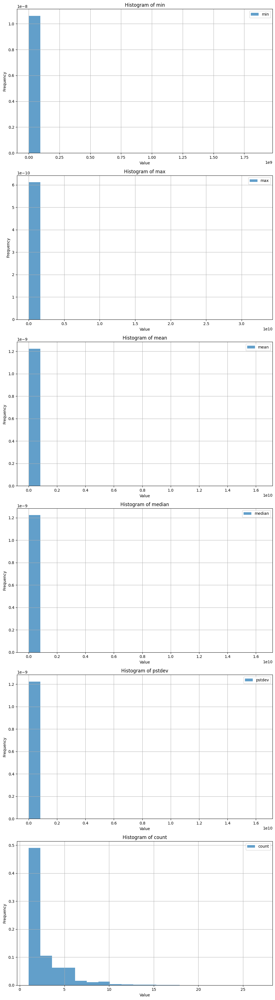

In [50]:
fig, axes = plt.subplots(nrows=len(statistics), ncols=1, figsize=(10, 6 * len(statistics)))

for ax, (measure, values) in zip(axes, statistics.items()):
    ax.hist(values, bins=20, alpha=0.7, label=measure, density=True)
    ax.set_xlabel("Value")
    ax.set_ylabel("Frequency")
    ax.set_title(f"Histogram of {measure}")
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()

          USER_ID Digraph       il        pl        rl        hl
0         21833_1      Th  27889.0       NaN       NaN       NaN
1         21833_1      Th      NaN  112225.0       NaN       NaN
2         21833_1      Th      NaN       NaN  138384.0       NaN
3         21833_1      Th      NaN       NaN       NaN   42025.0
4         21833_1      he  17956.0       NaN       NaN       NaN
...           ...     ...      ...       ...       ...       ...
6791487  160159_1      my      NaN       NaN       NaN  123904.0
6791488  349891_1      va   5329.0       NaN       NaN       NaN
6791489  349891_1      va      NaN   18225.0       NaN       NaN
6791490  349891_1      va      NaN       NaN   18496.0       NaN
6791491  349891_1      va      NaN       NaN       NaN    3969.0

[6791492 rows x 6 columns]


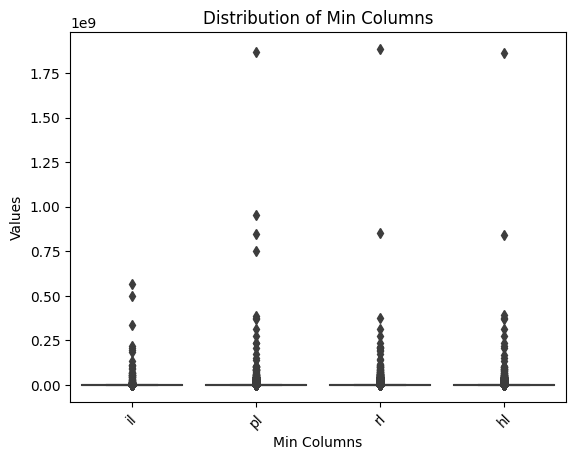

In [58]:
data = []
column_names = ['il', 'hl', 'pl', 'rl']

for index, row in dataset1.iterrows():
    user_id = row["USER_ID"]

    for col in df1.columns:
        if col.endswith("_min"):
            digraph = col.split("_")[0]
            count_col = col.split("_")[1]
            #print(count_col)
            
            if count_col in column_names and not pd.isna(row[col]):
                data.append({
                    "USER_ID": user_id,
                    "Digraph": digraph,
                    count_col: row[col]
                })

new4_df = pd.DataFrame(data)
print(new4_df)
new4_df = new4_df.drop_duplicates().reset_index(drop=True)
new4_df = new4_df.groupby(['USER_ID', 'Digraph']).sum().reset_index()

mean_columns = ['il', 'pl', 'rl', 'hl']
mean_data = new4_df[mean_columns]

sns.boxplot(data=mean_data)
plt.xlabel('Min Columns')
plt.ylabel('Values')
plt.title('Distribution of Min Columns')
plt.xticks(rotation=45)
plt.show()